goal - find the peaks in the hatchery data, plot time series of hatchery and wild for each year

In [27]:
#imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sys import platform
from scipy import stats
from scipy.signal import find_peaks
from scipy.signal import argrelextrema
import matplotlib.gridspec as gridspec
import math

In [3]:
if platform == "linux" or platform == "linux2":
    data_string = "/home/maria/Documents/data/pied_piper/puyallup/"
    output_string = "/home/maria/Documents/output/pied_piper/puyallup/"
else:
    data_string = "C:/Users/maria/OneDrive/Documents/data/pied_piper/puyallup/"
    output_string = "C:/Users/maria/OneDrive/Documents/output/pied_piper/puyallup/"

In [4]:
df = pd.read_csv(data_string + "puyallup_2004-2021_all_days.csv", header = 0)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df)

,Date,Unnamed: 0,flow,secchi_depth,In_day,In_night,In,chinook0_wild_num_day,chinook0_wild_perhour_day,chinook0_wild_num_night,chinook0_wild_perhour_night,chinook0_hatchery_num_day,chinook0_hatchery_perhour_day,chinook0_hatchery_num_night,chinook0_hatchery_perhour_night,chinook0_wild_perhour,chinook0_hatchery_perhour,trap_efficiency,chinook0_wild_perhour_day_estimate,chinook0_wild_perhour_night_estimate,chinook0_wild_perhour_estimate,chinook0_hatchery_perhour_day_estimate,chinook0_hatchery_perhour_night_estimate,chinook0_hatchery_perhour_estimate,chinook0_wild_day_fraction,chinook0_hatchery_day_fraction,flow_day,flow_night,secchi_depth_day,secchi_depth_night,chinook0_wild_num,chinook0_hatchery_num,chinook0_wild_num_day_estimate,chinook0_wild_num_night_estimate,chinook0_hatchery_num_day_estimate,chinook0_hatchery_num_night_estimate,trap_efficiency_day,trap_efficiency_night,chinook0_wild_day_num_estimate,chinook0_wild_night_num_estimate,chinook0_hatchery_day_num_estimate,chinook0_hatchery_night_num_estimate,chinook0_wild_num_estimate,doy,year,doy_original
0,2004-02-29,0.0,1050.000000,150.000,8.500000,13.75,22.250000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.004600,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,1050.000000,1050.000000,150.0,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60,2004.0,60.0
1,2004-03-01,1.0,982.000000,150.000,10.750000,15.25,26.000000,0.0,0.000000,2.0,0.131148,0.0,0.000000,0.0,0.000000,0.076923,0.000000,0.004600,0.000000,28.510018,16.722222,0.000000,0.000000,0.000000,0.000000,NaN,982.000000,982.000000,150.0,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61,2004.0,61.0
2,2004-03-02,2.0,923.000000,150.000,10.250000,13.75,24.000000,1.0,0.097561,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.041667,0.000000,0.004600,21.208672,0.000000,9.057870,0.000000,0.000000,0.000000,1.000000,NaN,923.000000,923.000000,150.0,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,62,2004.0,62.0
3,2004-03-03,3.0,955.000000,150.000,10.250000,14.25,24.500000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.004600,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,955.000000,955.000000,150.0,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63,2004.0,63.0
4,2004-03-04,4.0,1300.000000,150.000,9.250000,15.00,24.250000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.004600,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,1300.000000,1300.000000,150.0,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64,2004.0,64.0
5,2004-03-05,5.0,1360.000000,150.000,8.750000,14.00,22.750000,0.0,0.000000,2.0,0.142857,0.0,0.000000,0.0,0.000000,0.087912,0.000000,0.004600,0.000000,31.055556,19.111111,0.000000,0.000000,0.000000,0.000000,NaN,1360.000000,1360.000000,150.0,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,65,2004.0,65.0
6,2004-03-06,6.0,1340.000000,150.000,10.750000,14.75,25.500000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.004600,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,1340.000000,1340.000000,150.0,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,66,2004.0,66.0
7,2004-03-07,7.0,1230.000000,150.000,7.500000,16.25,23.750000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.004600,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,1230.000000,1230.000000,150.0,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67,2004.0,67.0
8,2004-03-08,8.0,1370.000000,150.000,7.750000,14.25,22.000000,2.0,0.258065,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.090909,0.000000,0.004600,56.100359,0.000000,19.762626,0.000000,0.000000,0.000000,1.000000,NaN,1370.000000,1370.000000,150.0,150.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68,2004.0,68.0
9,2004-03-09,9.0,1630.000000,150.000,10.750000,15.75,26.500000,0.0,0.000000,2.0,0.126984,0.0,0.000000,0.0,0.000000,0.075472,0.000000,0.004600,0.000000,27.6

In [14]:
df['chinook0_hatchery_perhour_inp'] = df['chinook0_hatchery_perhour'].interpolate(limit=10, limit_direction='forward')

[ 457  821 1192 2281 2667 3036 4108 4480 4848 5204 5572 5937 6303]


/home/maria/miniconda3/envs/analysis/lib/python3.8/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


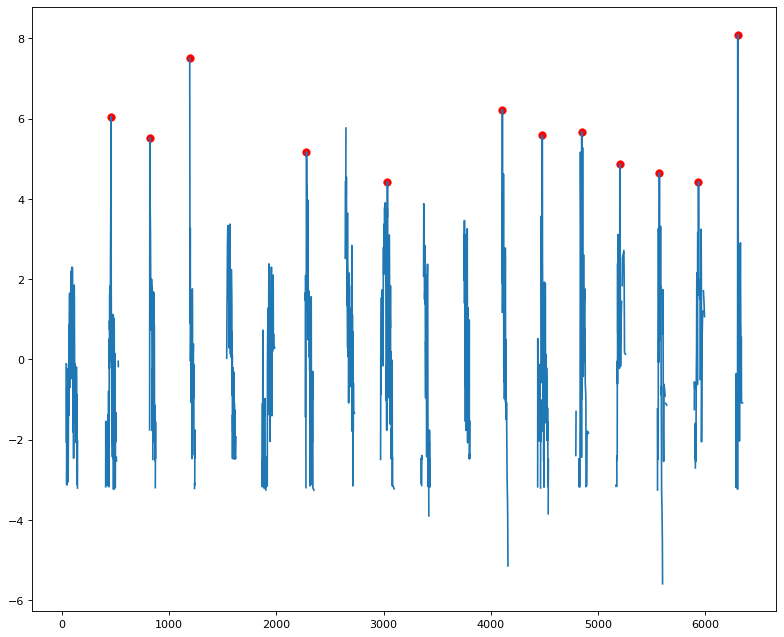

In [65]:
plt.figure(figsize=(12, 10), dpi=80)
plt.plot(np.log(df['chinook0_hatchery_perhour_inp']))
# c_max_index = argrelextrema(df['chinook0_hatchery_perhour'].to_numpy(copy=False), np.greater, order=5)
# plt.scatter(c_max_index[0],df['chinook0_hatchery_perhour'][c_max_index[0]],linewidth=0.3, s=50, c='r')


peaks, _ = find_peaks(df['chinook0_hatchery_perhour_inp'], height=50, distance = 25)
plt.scatter(peaks,np.log(df['chinook0_hatchery_perhour_inp'][peaks]),linewidth=0.3, s=50, c='r')
print(peaks)

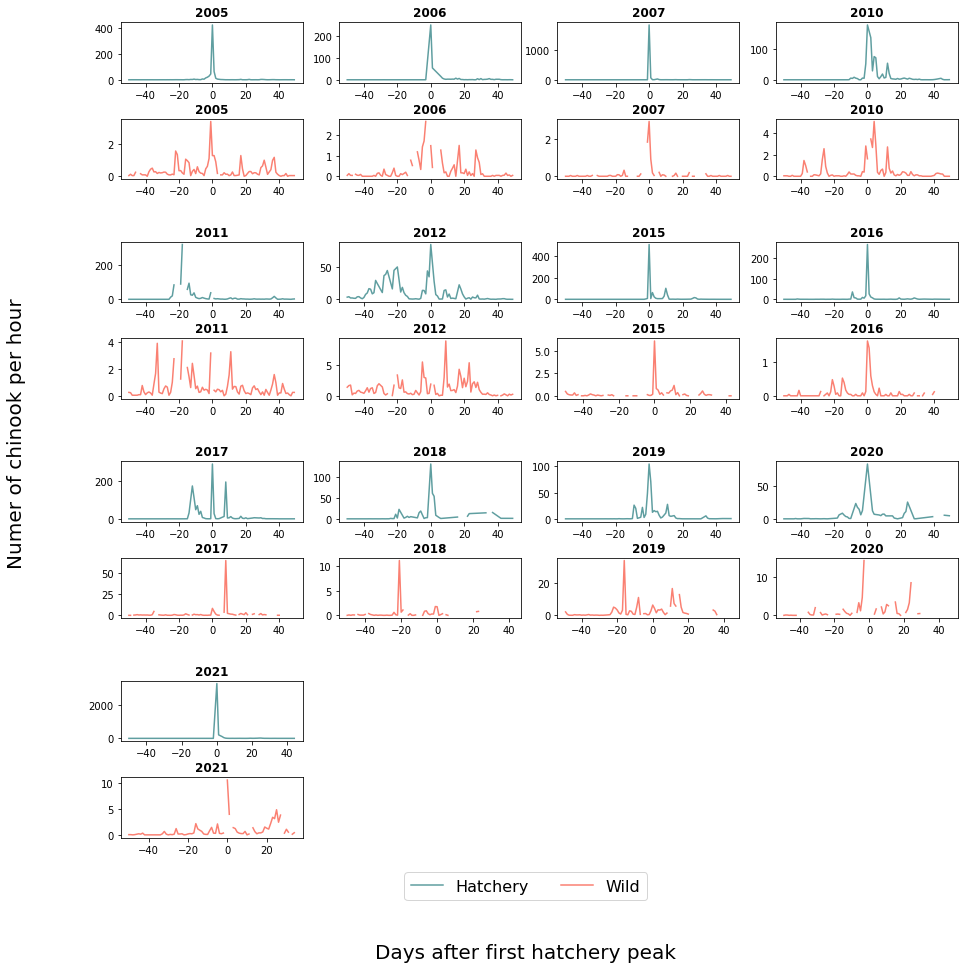

In [69]:
outer = gridspec.GridSpec(math.ceil(len(peaks)/ 4), 4, wspace=0.2, hspace=0.4)
fig = plt.figure(figsize=(15, 15))
count_plot = 0
line_handles = []  # List to hold line handles
line_labels = ["Hatchery", "Wild"]  # List to hold line labels
for i in peaks:
#     print(i)
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                                                 subplot_spec=outer[count_plot], wspace=0.1, hspace=0.6)
    count_plot = count_plot + 1 
    ax = plt.Subplot(fig, inner[0])
    line, = ax.plot(range(-50,50),
             df['chinook0_hatchery_perhour_inp'].iloc[i-50:i+50], "cadetblue")
    ax.set_title(str(int(df['year'][i])), fontweight="bold")
    fig.add_subplot(ax)
    line_handles.append(line)
    label = "Hatchery"
#     line_labels.append(label)
    
    
    ax1 = plt.Subplot(fig, inner[1])
    line, = ax1.plot(range(-50,50),
             df['chinook0_wild_perhour'].iloc[i-50:i+50], "salmon")
    ax1.set_title(str(int(df['year'][i])), fontweight="bold")
    fig.add_subplot(ax1)
    line_handles.append(line)
    label = "Wild"
#     line_labels.append(label)
fig.legend(line_handles, line_labels, loc='center', bbox_to_anchor=(0.5, 0.08), ncol=len(line_handles), 
           fontsize = 16)
fig.supxlabel("Days after first hatchery peak", fontsize=20)
fig.supylabel("Numer of chinook per hour", fontsize=20)
plt.savefig(output_string + 'chinook_hatchery_wild_each_year.jpeg',
                dpi=500)

<Figure size 432x288 with 0 Axes>